In [147]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio

pio.renderers.default = "notebook"
!wget -O data/0.4.csv "https://www.dropbox.com/s/adw14sidb1xb46j/data_0.4.csv?dl=0"
!wget -O data/0.5.csv "https://www.dropbox.com/s/08by79c4sd0u38p/data_0.5.csv?dl=0"
!wget -O data/0.6.csv "https://www.dropbox.com/s/d220h3shzoo8ox9/data_0.6.csv?dl=0"
!wget -O data/0.7.csv "https://www.dropbox.com/s/mfcvqzbw3xq2dva/data_0.7.csv?dl=0"

--2022-10-19 04:23:26--  https://www.dropbox.com/s/adw14sidb1xb46j/data_0.4.csv?dl=0
Resolviendo www.dropbox.com (www.dropbox.com)... 162.125.5.18
Conectando con www.dropbox.com (www.dropbox.com)[162.125.5.18]:443... conectado.
Petición HTTP enviada, esperando respuesta... 302 Found
Localización: /s/raw/adw14sidb1xb46j/data_0.4.csv [siguiendo]
--2022-10-19 04:23:26--  https://www.dropbox.com/s/raw/adw14sidb1xb46j/data_0.4.csv
Reutilizando la conexión con www.dropbox.com:443.
Petición HTTP enviada, esperando respuesta... 302 Found
Localización: https://uc71506600bd37b5dd708c7269e3.dl.dropboxusercontent.com/cd/0/inline/BvEdsu5Up24ed30pHgdrGR91UEnuktATFrAa8xVYEiCHOG7mRuzHZE08SAeJU281IFNgQimwfuPh0vPIpgSURVxsi-POVepRjXmcXAG3V-qaGc5h549XfoSXway-lbCcSiLcU6B4PLFKa4PQuuablN-2z0e-kjP4HviboMjR4lOSNA/file# [siguiendo]
--2022-10-19 04:23:27--  https://uc71506600bd37b5dd708c7269e3.dl.dropboxusercontent.com/cd/0/inline/BvEdsu5Up24ed30pHgdrGR91UEnuktATFrAa8xVYEiCHOG7mRuzHZE08SAeJU281IFNgQimwfuPh0vPIpg

## Charge all the datasets of information



In [148]:
data_04 = pd.read_csv("data/0.4.csv")
data_05 = pd.read_csv("data/0.5.csv")
data_06 = pd.read_csv("data/0.6.csv")
data_07 = pd.read_csv("data/0.7.csv")

##### **Calculate the mean of every row of the dataset**

In [149]:
# calculate the mean of every id and group by model


data_04_mean = data_04.groupby(["model", "Replace", "dataset"]).mean()
data_05_mean = data_05.groupby(["model", "Replace", "dataset"]).mean()
data_06_mean = data_06.groupby(["model", "Replace", "dataset"]).mean()
data_07_mean = data_07.groupby(["model", "Replace", "dataset"]).mean()

# merge the dataframes
data_mean = pd.concat([data_04_mean, data_05_mean, data_06_mean, data_07_mean]).drop(
    ["id"], axis=1
)
data_mean.reset_index(inplace=True)
data_mean.sort_values(by=["model", "dataset", "Ratio"], inplace=True)
# reset index
data_mean.reset_index(inplace=True)
data_mean.drop(["index", "Ratio"], axis=1, inplace=True)

/var/folders/z2/hzn8xqy537x0xvfzqzp8jr580000gn/T/ipykernel_9707/365256201.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/z2/hzn8xqy537x0xvfzqzp8jr580000gn/T/ipykernel_9707/365256201.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/z2/hzn8xqy537x0xvfzqzp8jr580000gn/T/ipykernel_9707/365256201.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

In [150]:
data_normal = data_mean.query(" dataset != 0")

# make a table comparring accuracy of the diferent model with same ratio, replace and dataset
data_accuracy = data_normal.pivot_table(
    index=["dataset", "model", "Replace"],
    values=[
        "Accuracy",
        "F1 Prefix",
        "F1 random",
        "Recall Prefix",
        "Recall random",
        "Precision Prefix",
        "Precision random",
    ],
)
data_accuracy.reset_index(inplace=True)

In [151]:
# use plotly express lines based on dataset accuracy and model
fig = px.line(
    data_normal,
    x="Replace",
    y="Accuracy",
    color="model",
    facet_col="dataset",
    facet_col_wrap=3,
    title="Accuracy",
    # set the x from 0 to 1
    range_x=[0.3, 0.75],
    range_y=[0.7, 1],
)
fig.show()

In [152]:
# use plotly express
fig = px.bar(
    data_accuracy,
    x="dataset",
    y="Accuracy",
    color="model",
    barmode="group",
    facet_col="Replace",
    title="F1 Prefix of the models",
)


fig.show()

pass this to a new dataset

In [153]:
data_mean.to_csv("data_mean.csv")

### Graphics of comparing loss on train and val on every experiment

In [154]:
train_loss = [col for col in data_mean.columns if "Train Loss" in col]
val_loss = [col for col in data_mean.columns if "Val Loss" in col]
train_acc = [col for col in data_mean.columns if "train Accuracy" in col]
test_acc = [col for col in data_mean.columns if "test Accuracy" in col]
train_loss_df = data_mean[train_loss]
val_loss_df = data_mean[val_loss]
train_accuracies_df = data_mean[train_acc]
test_accuracies_df = data_mean[test_acc]


def get_mean(df, mode):
    new = []
    for i in range(len(df.columns)):
        # obtain the columns
        col = df.columns[i]
        val = df[col]
        new.append(val)
    columns = []
    for i in range(len(data_mean)):
        # obtain the columns
        name = (
            data_mean["model"][i]
            + " "
            + str(data_mean["dataset"][i])
            + " "
            + str(data_mean["Replace"][i])
        )
        columns.append(name)
    return new, columns


train_values, train_columns = get_mean(train_loss_df, "Train Loss")
val_values, val_columns = get_mean(val_loss_df, "Val Loss")
acc_values, acc_columns = get_mean(train_accuracies_df, "train Accuracy")
test_values, test_columns = get_mean(test_accuracies_df, "Test Accuracy")

train_loss = pd.DataFrame(train_values)
val_loss = pd.DataFrame(val_values)
train_acc = pd.DataFrame(acc_values)
test_acc = pd.DataFrame(test_values)


# rename columns whit the name of the model
train_loss.columns = train_columns
val_loss.columns = val_columns
train_acc.columns = acc_columns
test_acc.columns = test_columns


for df in [train_loss, val_loss, train_acc, test_acc]:
    df.reset_index(inplace=True)
    df.drop(["index"], axis=1, inplace=True)

In [155]:
train_loss.head()

,euclidean 10 0.4,euclidean 10 0.5,euclidean 10 0.6,euclidean 10 0.7,euclidean 30 0.4,euclidean 30 0.5,euclidean 30 0.6,euclidean 30 0.7,euclidean 50 0.4,euclidean 50 0.5,...,hyperbolic 30 0.6,hyperbolic 30 0.7,hyperbolic 50 0.4,hyperbolic 50 0.5,hyperbolic 50 0.6,hyperbolic 50 0.7,hyperbolic 70 0.4,hyperbolic 70 0.5,hyperbolic 70 0.6,hyperbolic 70 0.7
0,0.604495,0.699617,0.700927,0.700087,0.665536,0.689952,0.690304,0.700085,0.668287,0.685193,...,0.691477,0.698525,0.659371,0.683480,0.693205,0.700734,0.626583,0.674402,0.688669,0.695814
1,0.245801,0.665575,0.667816,0.668859,0.528430,0.629212,0.635019,0.684067,0.553470,0.619049,...,0.627309,0.681949,0.524147,0.609685,0.653707,0.682064,0.460899,0.583887,0.631817,0.663851
2,0.129797,0.621460,0.621958,0.627619,0.444514,0.581005,0.588020,0.670637,0.493183,0.575253,...,0.576053,0.666727,0.464656,0.562401,0.622603,0.667572,0.410356,0.539669,0.593461,0.638150
3,0.092767,0.591967,0.588981,0.595879,0.393032,0.547808,0.553753,0.657965,0.461151,0.549472,...,0.540085,0.653280,0.432736,0.536754,0.603154,0.655368,0.385450,0.518768,0.573011,0.621762
4,0.073164,0.575887,0.572428,0.579579,0.355078,0.521034,0.525581,0.648025,0.438751,0.531012,...,0.508025,0.642086,0.406835,0.518351,0.589577,0.646351,0.368734,0.505382,0.560324,0.611033


***Function to obtain the loss of each experiment***

In [156]:
def filter(df, types, alls, filtter, dataset="10", replace="0.1"):

    data = df.copy()
    finals = []
    stay = []
    for i in range(len(df.columns)):
        col = df.columns[i]
        dataseet = col.split(" ")[1]
        replaced = col.split(" ")[2]
        if alls:
            stay.append(col)
            finals.append(col.split(" ")[0] + " " + types)
        else:
            if (dataset == dataseet) and (replace == replaced):
                stay.append(col)
                finals.append(col.split(" ")[0] + " " + types)
            elif filtter in col and filtter != "":
                stay.append(col)
                finals.append(col.split(" ")[0] + " " + types)
    data = data[stay]
    data.columns = finals
    return data


def values(
    train,
    other,
    types,
    filtter="",
    alls=False,
    dataset="10",
    replace="0.5",
):
    train = filter(train, "train", alls, filtter, dataset, replace)
    other = filter(other, types, alls, filtter, dataset, replace)

    return pd.concat([train, other], axis=1)

# **Compares of Accuracy and Loss**



### 1) ***All experiments comparation***

In [157]:
data = values(types="test", train=train_acc, other=test_acc, alls=True)

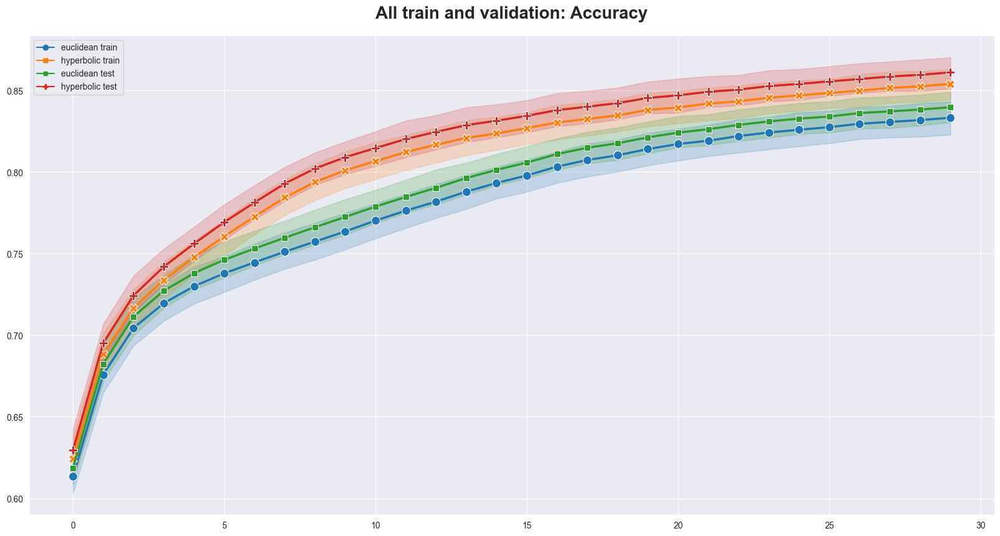

In [158]:
sns.set_style("darkgrid")
plt.figure(figsize=(20, 10))

sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.title("All train and validation: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

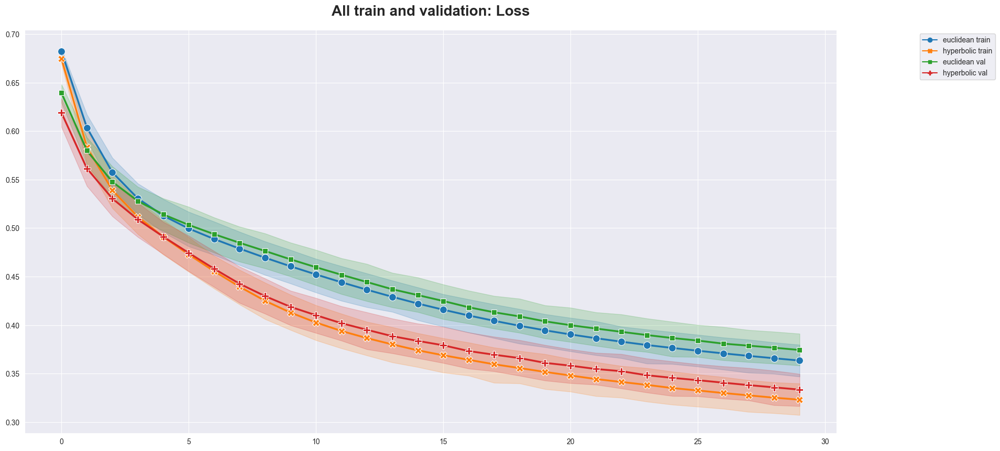

In [159]:
sns.set_style("darkgrid")
data = values(types="val", train=train_loss, other=val_loss, alls=True)
plt.figure(figsize=(20, 10))

sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1), ncol=1)
plt.title("All train and validation: Loss", fontsize=20, fontweight="bold", pad=20)
plt.show()

### 2) Comparation of Z-Prefix


#### 1) ***Z-Prefix 10%***

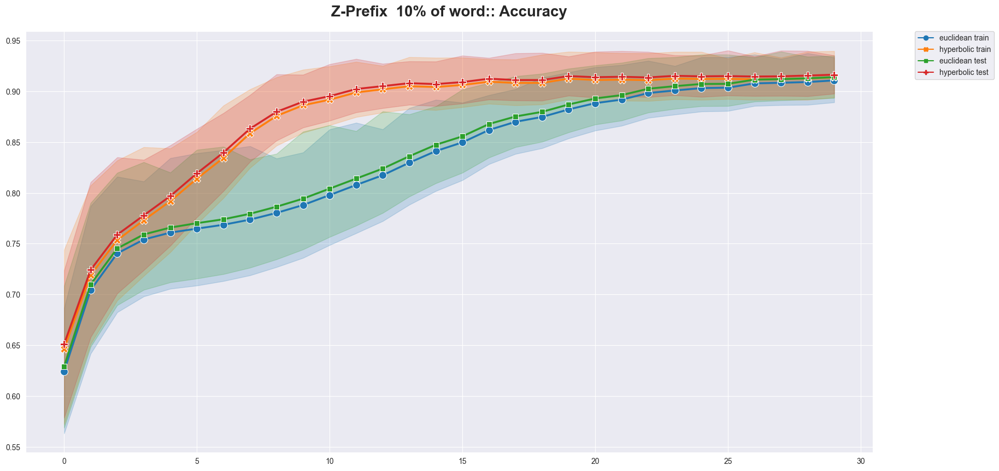

In [160]:
data = values(
    types="test",
    filtter="10",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  10% of word:: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

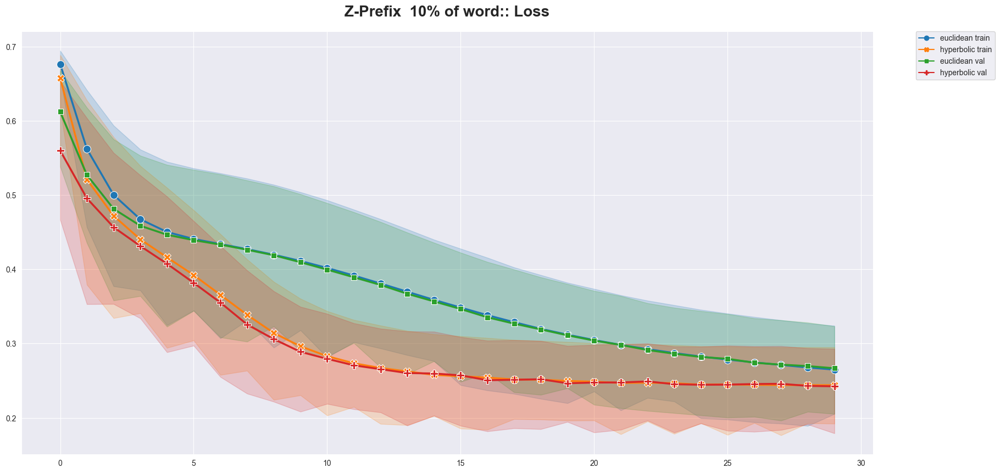

In [161]:
data = values(
    types="val",
    filtter="10",
    train=train_loss,
    other=val_loss,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  10% of word:: Loss", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### ***Z-Prefix 30%***

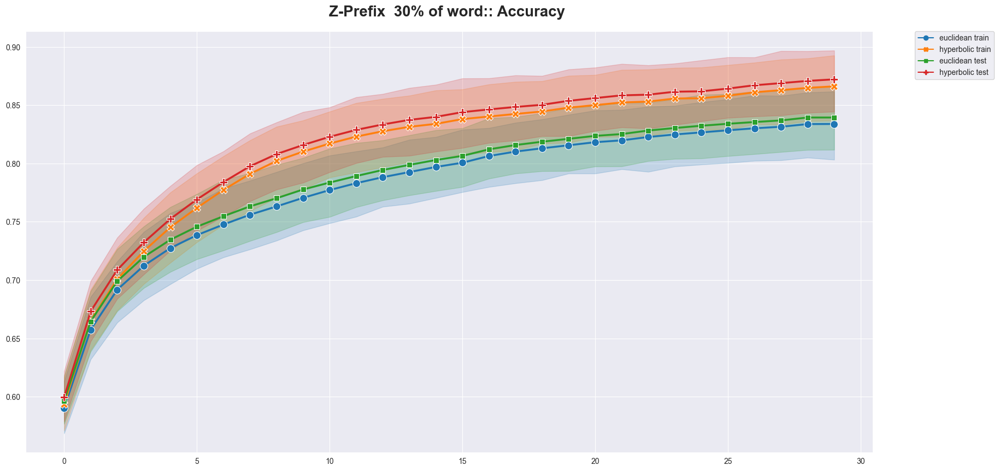

In [162]:
data = values(
    types="test",
    filtter="30",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  30% of word:: Accuracy ", fontsize=20, fontweight="bold", pad=20)
plt.show()

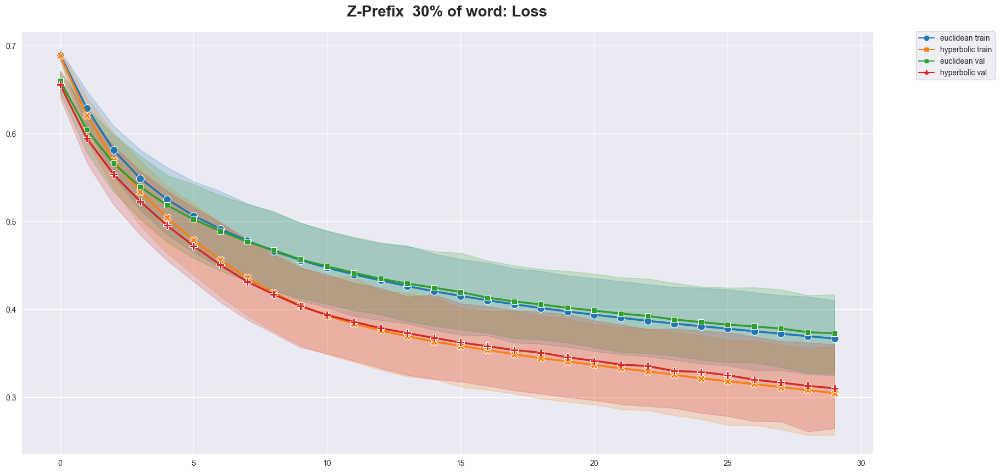

In [163]:
data = values(
    types="val",
    filtter="30",
    train=train_loss,
    other=val_loss,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  30% of word: Loss", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### ***Z-Prefix 50%***

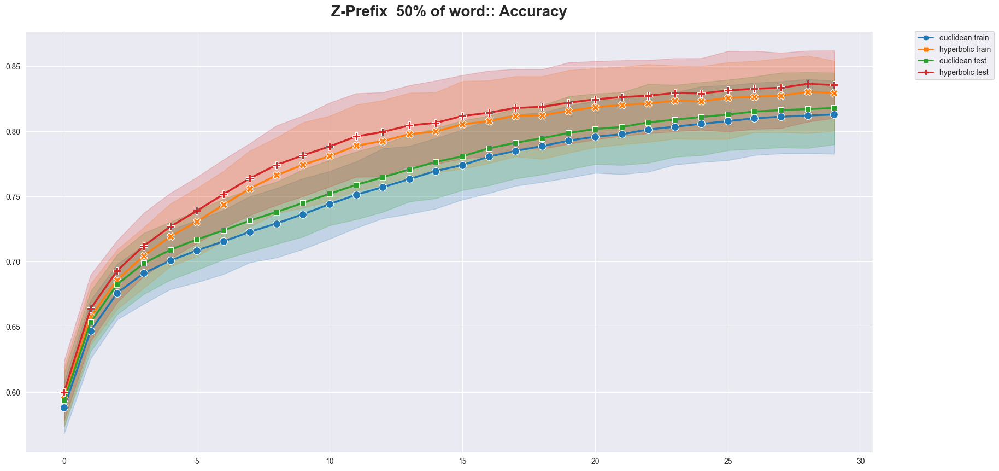

In [164]:
data = values(
    types="test",
    filtter="50",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  50% of word:: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

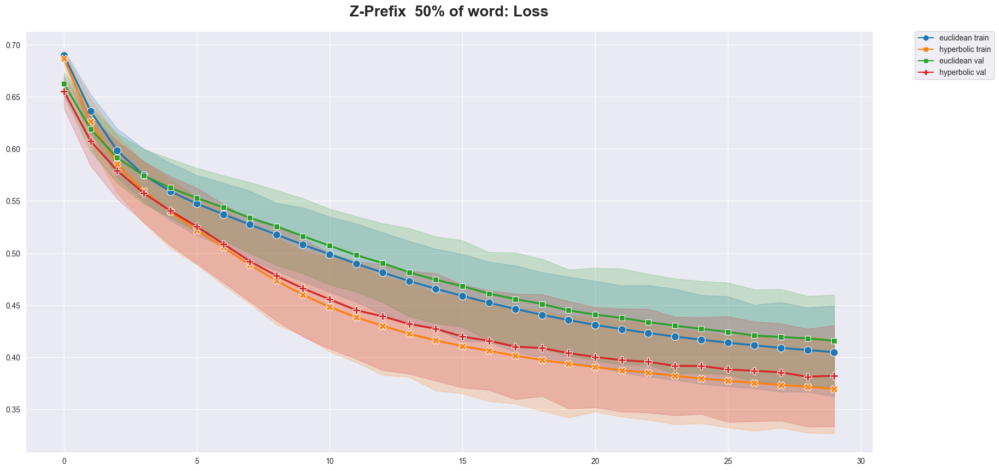

In [165]:
data = values(
    types="val",
    filtter="50",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  50% of word: Loss", fontsize=20, fontweight="bold", pad=20)
plt.show()

## 3) Only  Replace comparation

### ***Replace 40%***

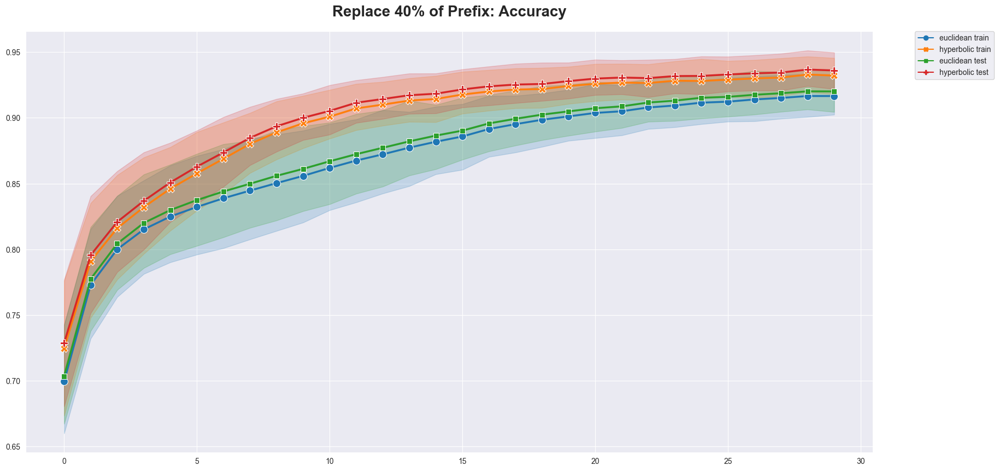

In [166]:
data = values(
    types="test",
    filtter="0.4",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 40% of Prefix: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

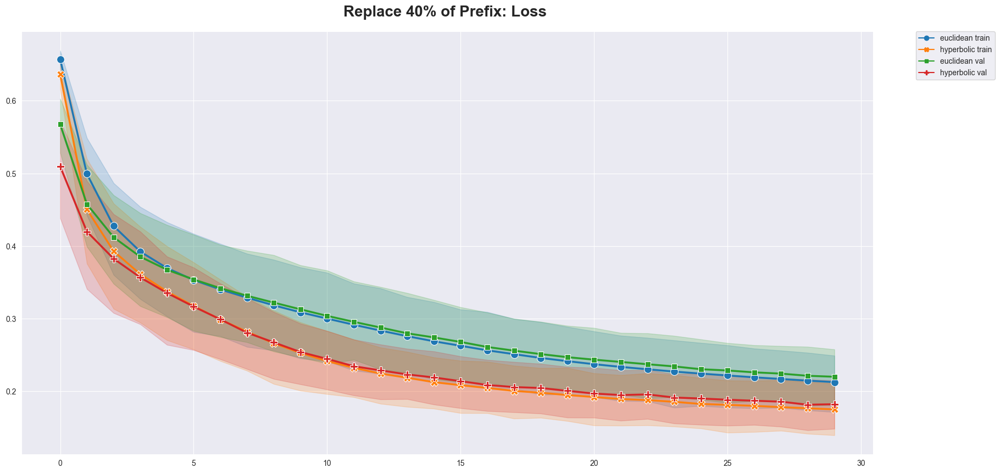

In [167]:
data = values(
    types="val",
    filtter="0.4",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 40% of Prefix: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

###  Replace 50%

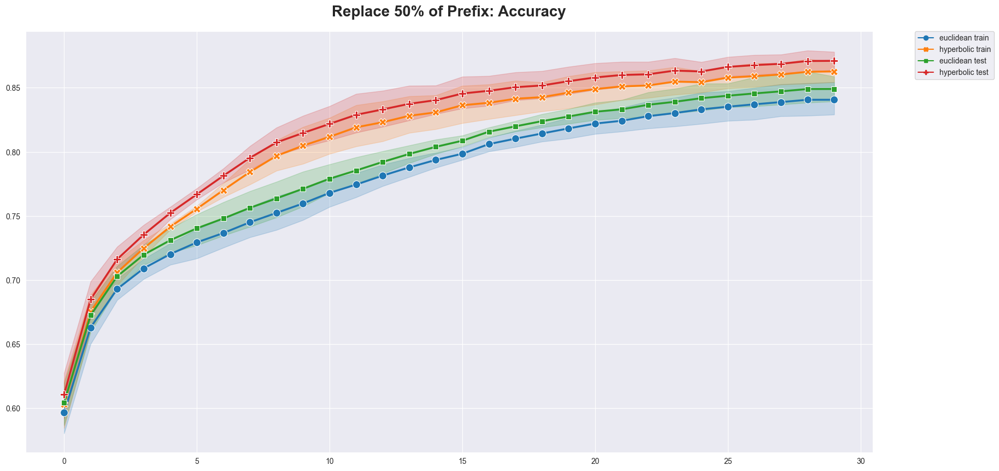

In [168]:
data = values(
    types="test",
    filtter="0.5",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 50% of Prefix: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

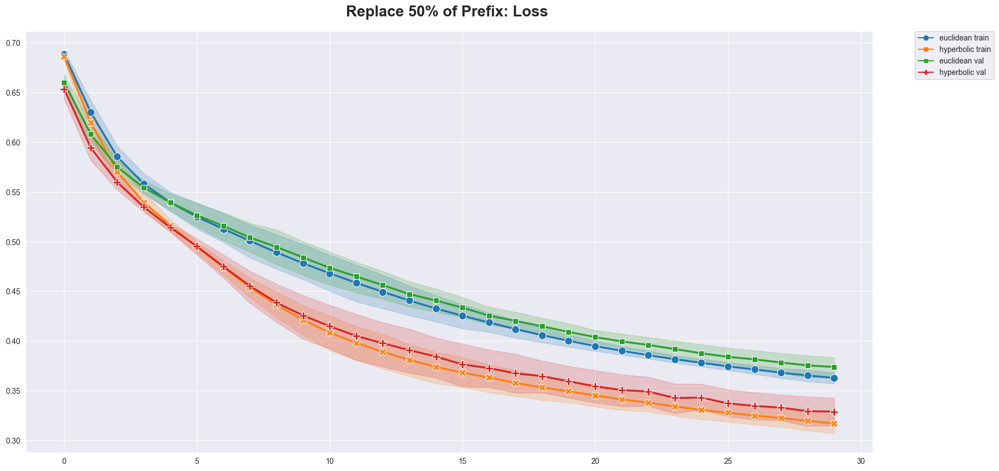

In [169]:
data = values(
    types="val",
    filtter="0.5",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 50% of Prefix: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

###   ***Replace 60%***

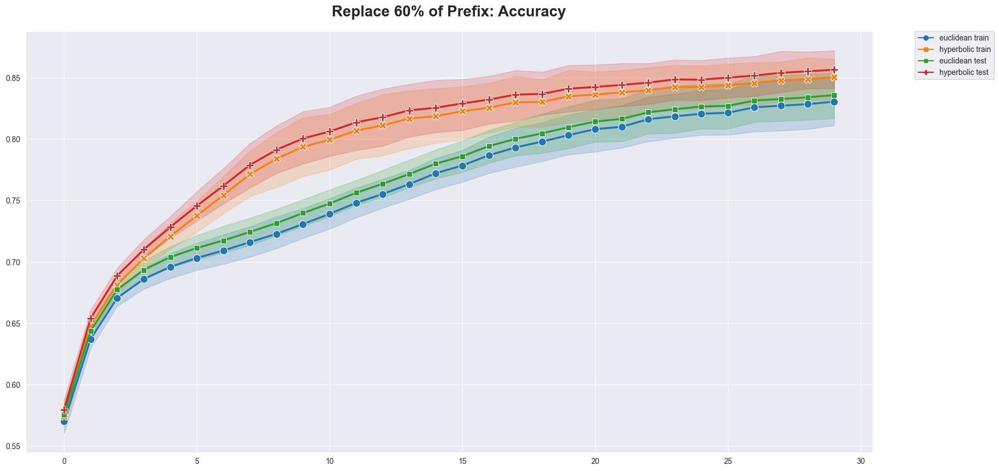

In [170]:
data = values(
    types="test",
    filtter="0.6",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 60% of Prefix: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

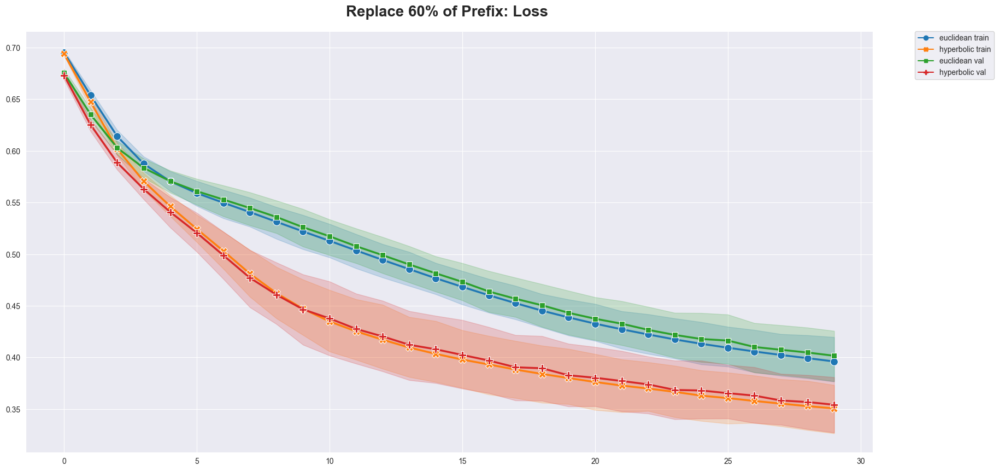

In [171]:
data = values(
    types="val",
    filtter="0.6",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 60% of Prefix: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

### ***Replace 70%***

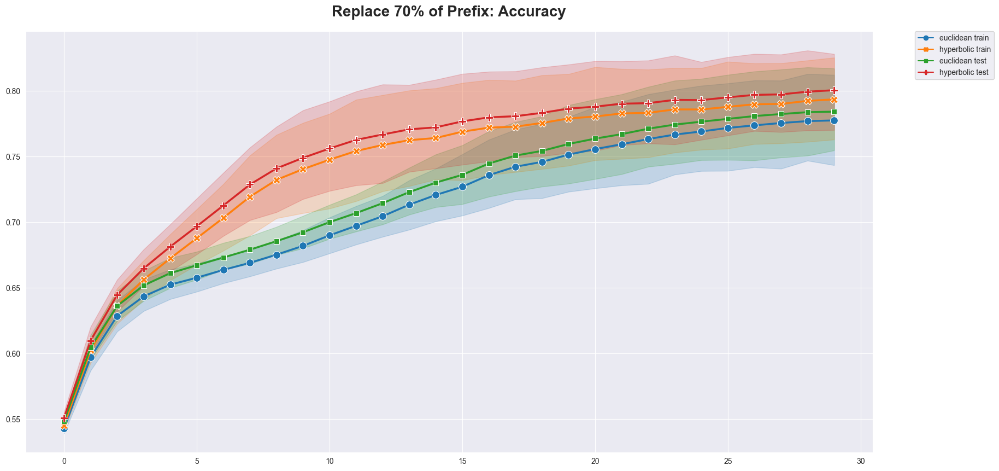

In [172]:
data = values(
    types="test",
    filtter="0.7",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 70% of Prefix: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

talvez necesita mas tiempo para aprender lo mismo 

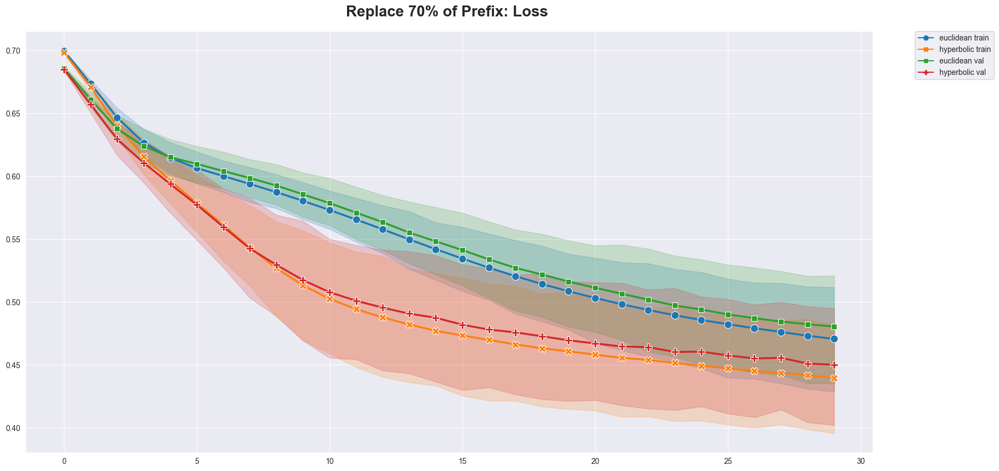

In [173]:
data = values(
    types="val",
    filtter="0.7",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Replace 70% of Prefix: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

## 4) Comparation of Z-Prefix and Replace



### 1) ***Z-Prefix 10%*** 

 ####       I) *Replace 40%*
 
- in this case is the standard

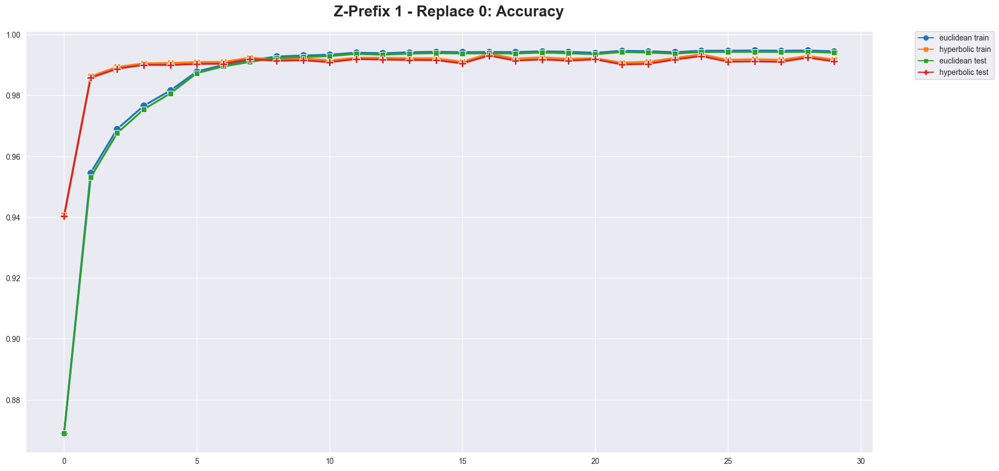

In [174]:
data = values(
    types="test",
    dataset="10",
    replace="0.4",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 1 - Replace 0: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

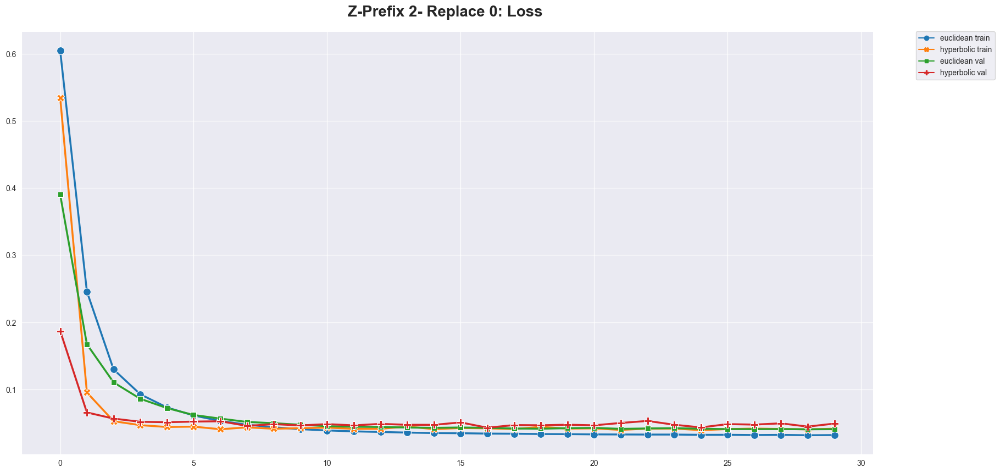

In [175]:
data = values(
    types="val",
    dataset="10",
    replace="0.4",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 2- Replace 0: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### II) *Replace 50%*

 - In this case is with only one character Changed

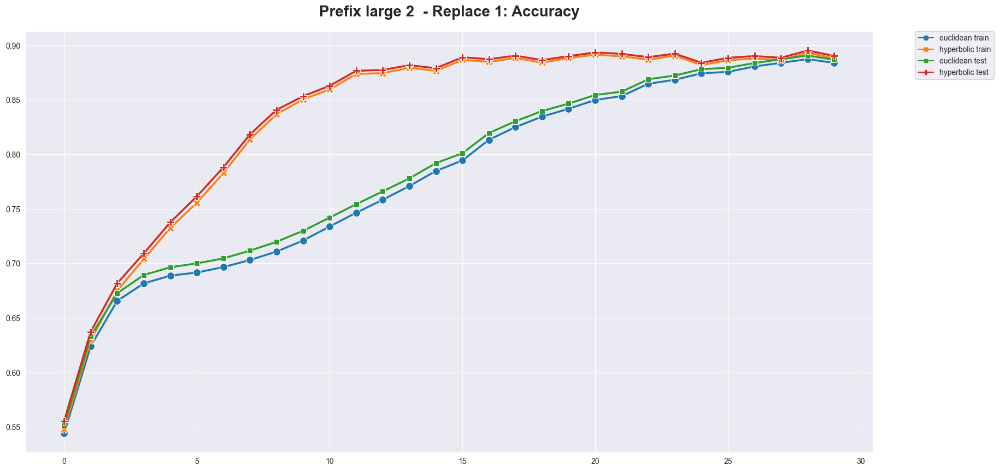

In [176]:
data = values(
    types="test",
    dataset="10",
    replace="0.5",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title(
    "Prefix large 2  - Replace 1: Accuracy", fontsize=20, fontweight="bold", pad=20
)
plt.show()

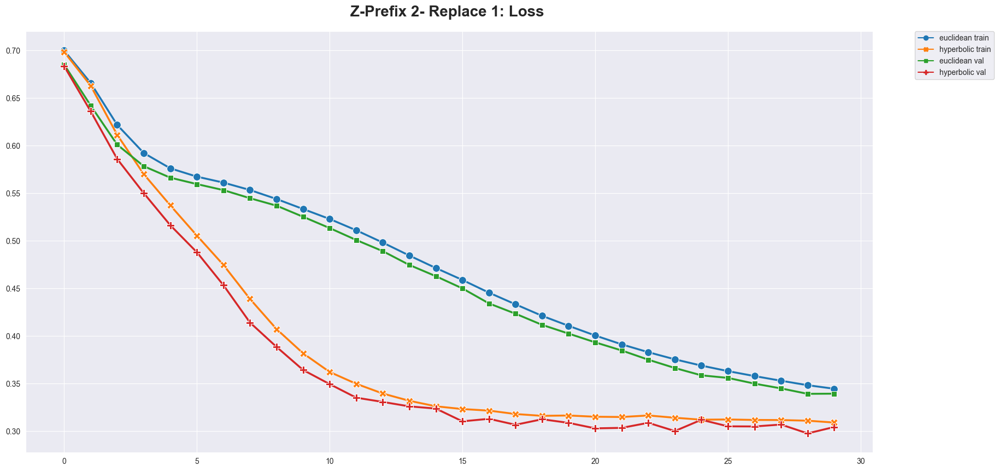

In [177]:
data = values(
    types="val",
    dataset="10",
    replace="0.5",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 2- Replace 1: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

### 2) ***Z-Prefix 30%***


#### I) *Replace 40%*

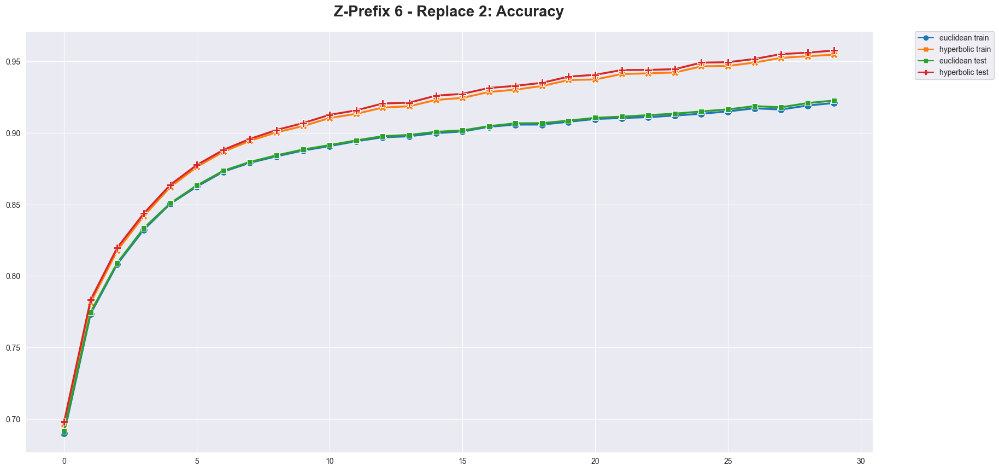

In [178]:
data = values(
    types="test",
    dataset="30",
    replace="0.4",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6 - Replace 2: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

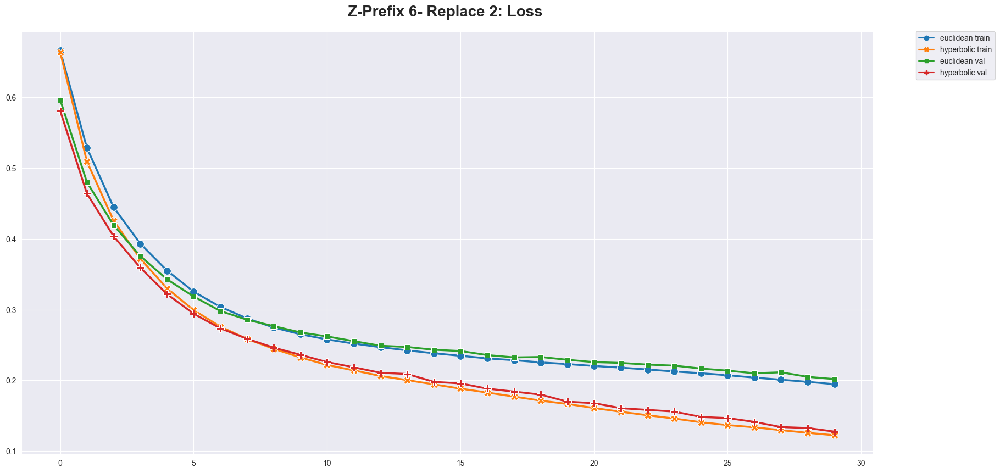

In [179]:
data = values(
    types="val",
    dataset="30",
    replace="0.4",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6- Replace 2: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### II) *Replace 50%*

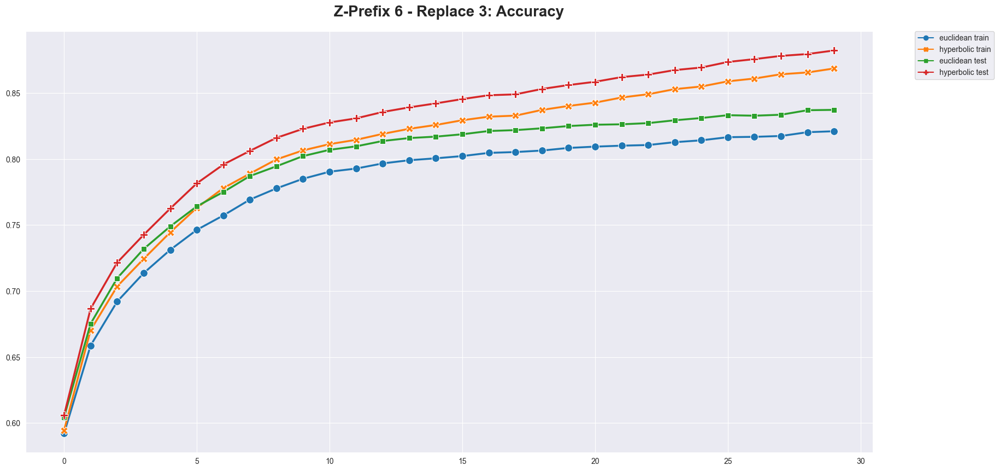

In [180]:
data = values(
    types="test",
    dataset="30",
    replace="0.5",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6 - Replace 3: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

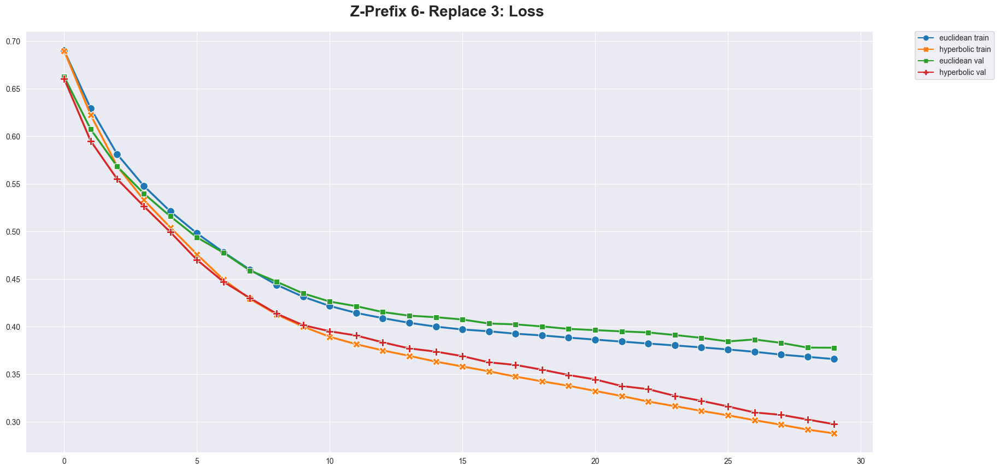

In [181]:
data = values(
    types="val",
    dataset="30",
    replace="0.5",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6- Replace 3: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### III) *Replace 60%*

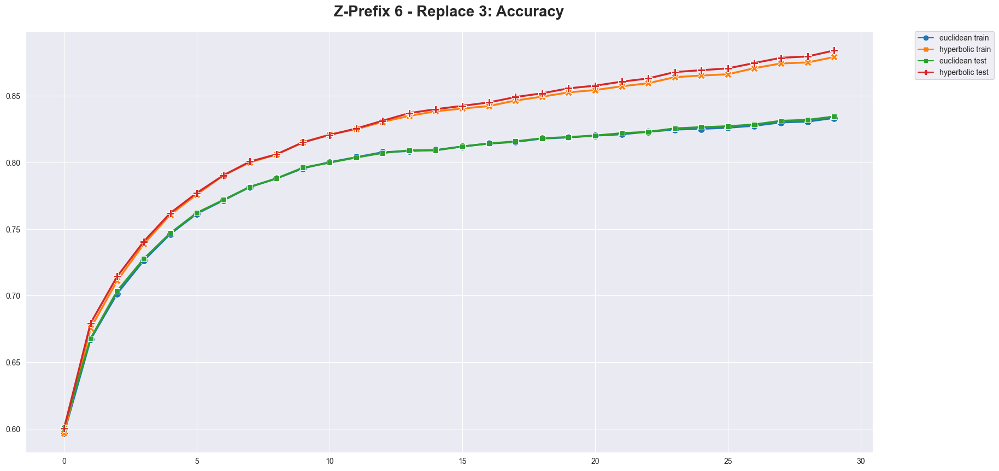

In [182]:
data = values(
    types="test",
    dataset="30",
    replace="0.6",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6 - Replace 3: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

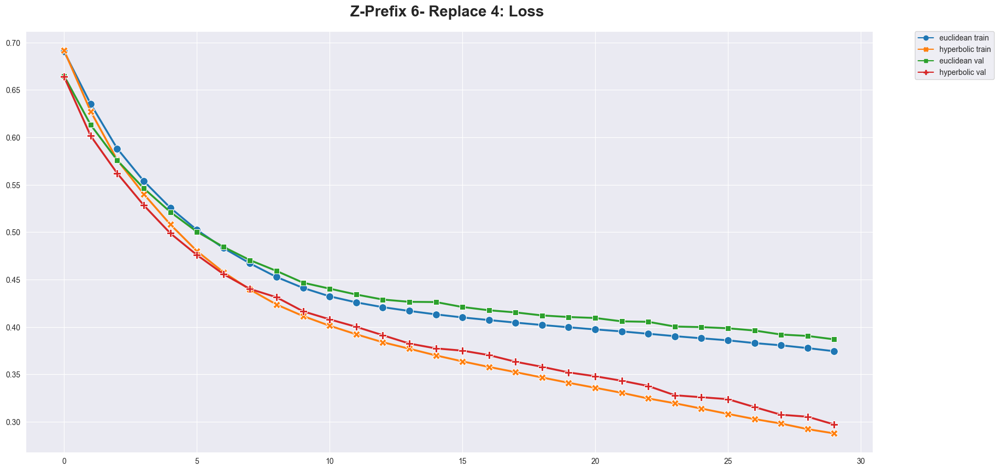

In [183]:
data = values(
    types="val",
    dataset="30",
    replace="0.6",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6- Replace 4: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### IV) *Replace 70%*

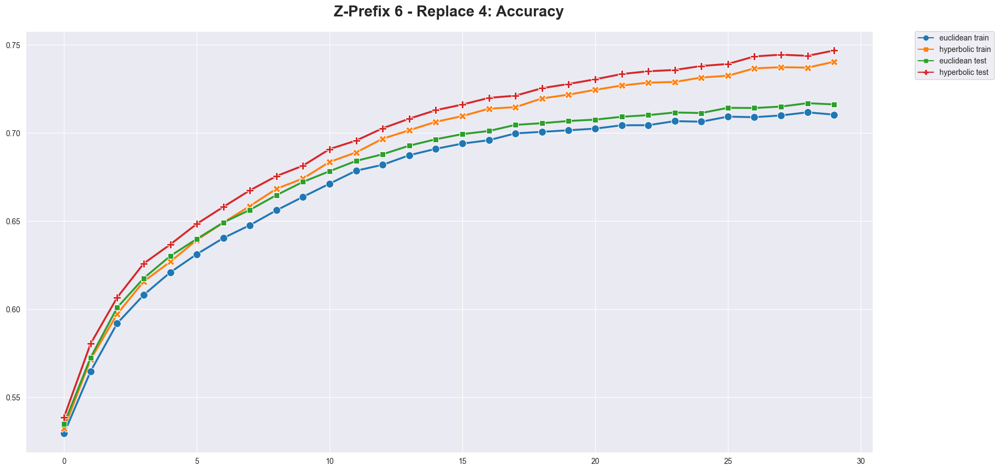

In [184]:
data = values(
    types="test",
    dataset="30",
    replace="0.7",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6 - Replace 4: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

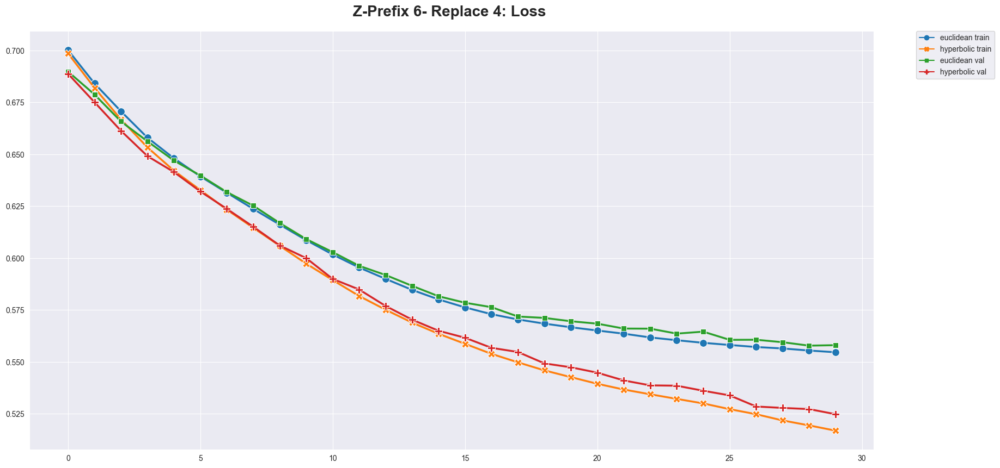

In [185]:
data = values(
    types="val",
    dataset="30",
    replace="0.7",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 6- Replace 4: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

### 3) ***Z-Prefix 50%***


#### I) *Replace 40%*

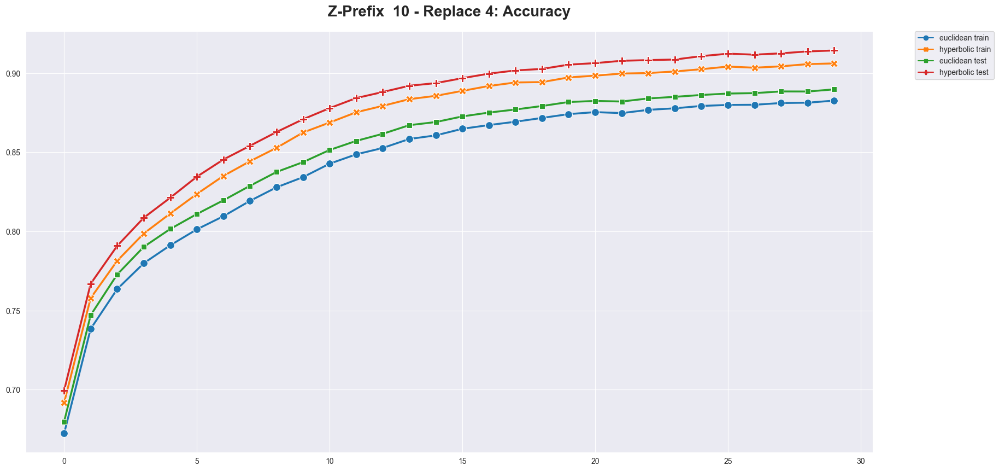

In [186]:
data = values(
    types="test",
    dataset="50",
    replace="0.4",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix  10 - Replace 4: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

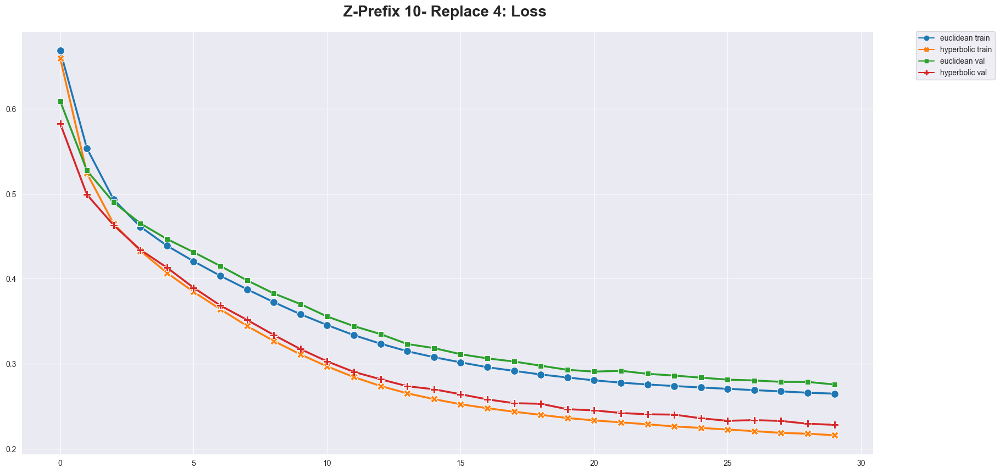

In [187]:
data = values(
    types="val",
    dataset="50",
    replace="0.4",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10- Replace 4: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### II) *Replace 50%*

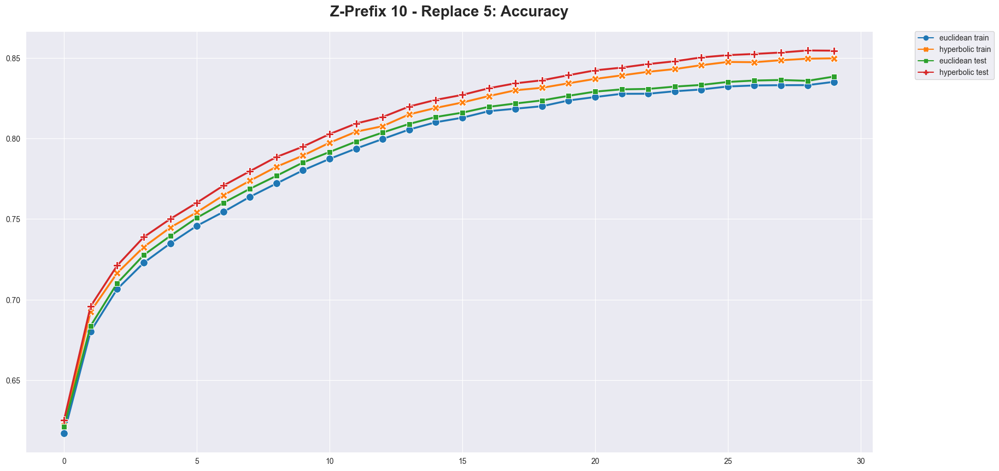

In [188]:
data = values(
    types="test",
    dataset="50",
    replace="0.5",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10 - Replace 5: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

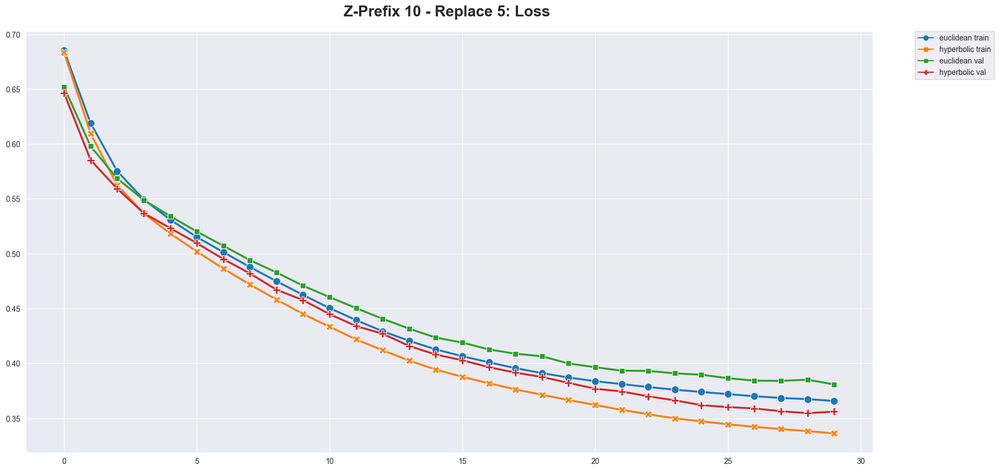

In [189]:
data = values(
    types="val",
    dataset="50",
    replace="0.5",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10 - Replace 5: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

 
#### III) *Replace 60%*

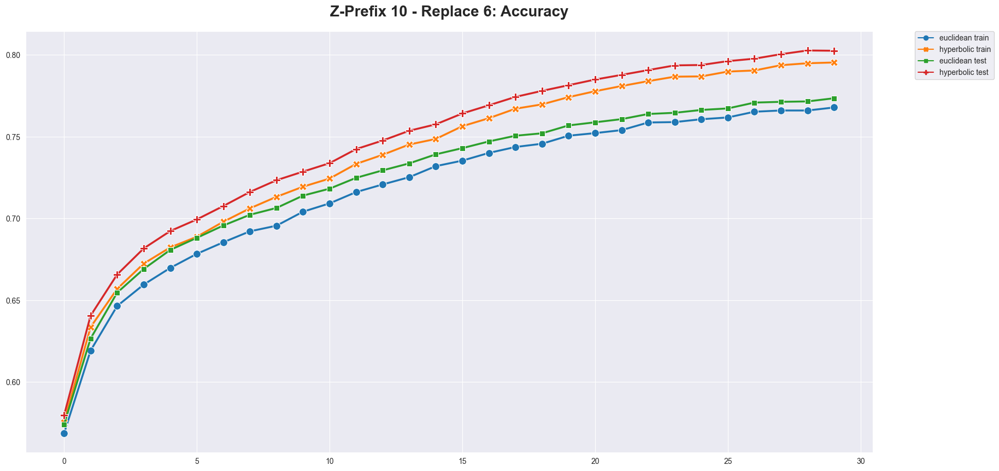

In [190]:
data = values(
    types="test",
    dataset="50",
    replace="0.6",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10 - Replace 6: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

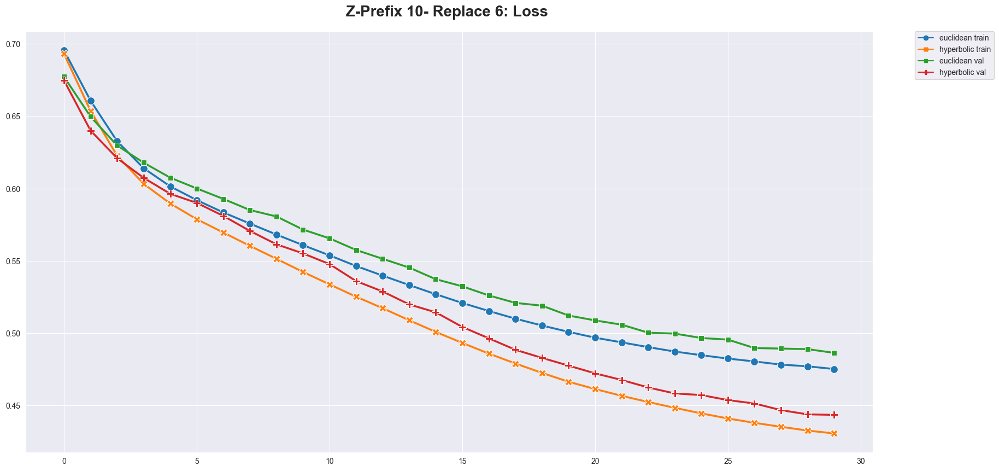

In [191]:
data = values(
    types="val",
    dataset="50",
    replace="0.6",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10- Replace 6: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

#### IV) *Replace 70%*

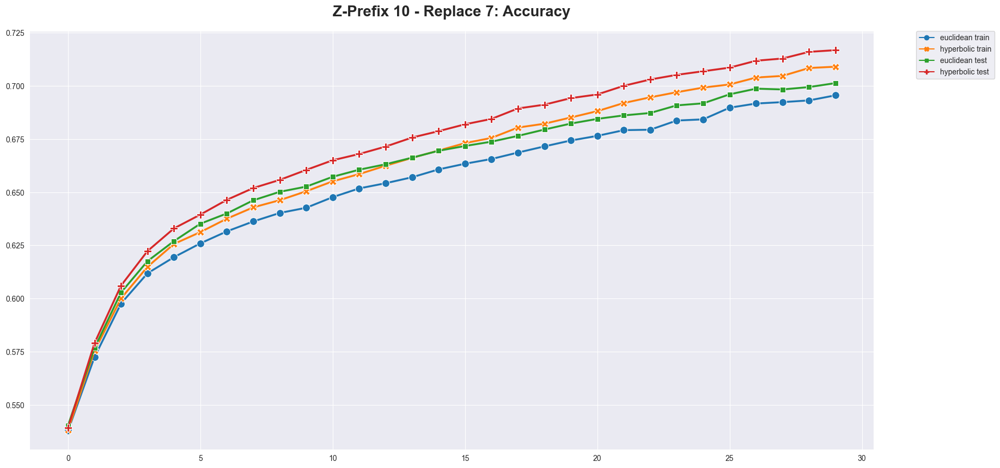

In [192]:
data = values(
    types="test",
    dataset="50",
    replace="0.7",
    train=train_acc,
    other=test_acc,
)

plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10 - Replace 7: Accuracy", fontsize=20, fontweight="bold", pad=20)
plt.show()

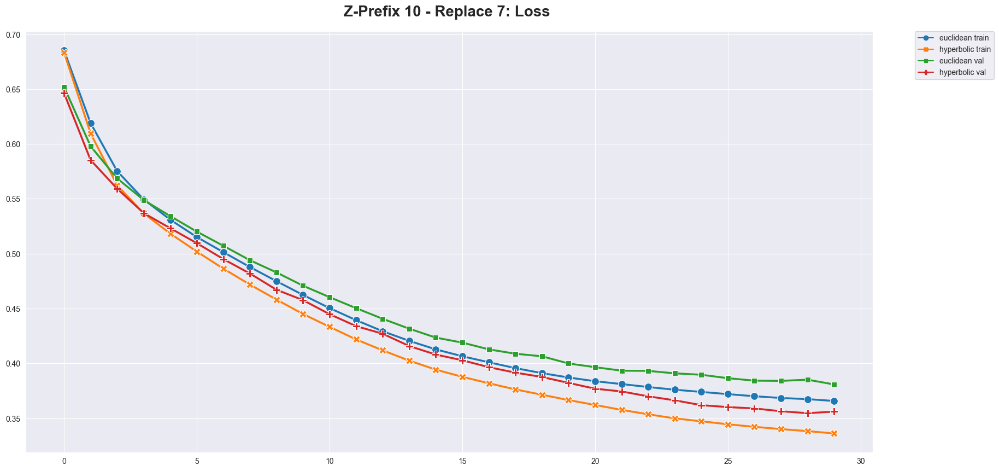

In [193]:
data = values(
    types="val",
    dataset="50",
    replace="0.5",
    train=train_loss,
    other=val_loss,
)
plt.figure(figsize=(20, 10))
sns.lineplot(
    data=data,
    dashes=False,
    markers=True,
    palette="tab10",
    linewidth=2.5,
    markersize=10,
    legend="full",
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.title("Z-Prefix 10 - Replace 7: Loss ", fontsize=20, fontweight="bold", pad=20)
plt.show()

### Intermediate Conclusion:

- For 0.1 replace the results are practical the same
- Something similar happends for 0.3 replace
- Now we have to explore on 0.4 and 0.6 replace to see if the results are the same.
- Hyperbolic in every case is better than Euclidean, but we have to try with other experiments